### Example 2 - Animation of oxygen measurements over time

This example shows how to read and manipulate Argo profiles data stored in parquet format to create an animation showing the growth of Argo's BCG fleet over time.

#### Getting started

We start by the modules and the file paths. We also provide the schema (e.g. column names and data types) that pyarrow will need to read the parquet database. This speeds up read operations, as pyarrow does not need to guess the schema from the files.

In [4]:
from datetime import datetime
import numpy as np
import pandas as pd
import xarray as xr
import pyarrow as pa
import pyarrow.parquet as pq
import glob
from pprint import pprint

# Paths to parquet database
parquet_dir = '../data/parquet/bgc/'

# Setting up parquet schema
schema_path = '../schemas/ArgoBGC_schema.metadata'
BGC_schema = pq.read_schema(schema_path)

As we want to visualize the growth of Argo's BGC fleet, we don't want to set any geographical or temporal constraint. We still know that all we need to make the animation are the float ID, and the dissolved oxygen data with the coordinates and time of the measurements.

We set this through the `columns` variable in `read_parquet()`, while we set a filter to discard `NaN` values. Note that the pyarrow's syntax cannot explicitly remove non-valid numbers, so we work around this by allowing a number to be inside a very very large range.

NB: The next cell will load ~2.6 GB of data into memory. If you just executed another example in the same jupyter lab session, I recommend you free up the memory it is using (e.g. by shutting down its kernel).

In [2]:
%%time
ref_var = 'DOXY_ADJUSTED'
cols = [ref_var,"LATITUDE","LONGITUDE","JULD","PLATFORM_NUMBER"]
filter_nans = [ ("DOXY_ADJUSTED", ">", -1e30), ("DOXY_ADJUSTED", "<", +1e30) ]
ds = pq.ParquetDataset(
    parquet_dir,
    schema=BGC_schema,
    filters=filter_nans
)
df = ds.read(columns=cols).to_pandas()
print( str( df.memory_usage().sum()*1e-9 ) + " GB.")
df

2.618598152 GB.
CPU times: user 13.8 s, sys: 4.36 s, total: 18.1 s
Wall time: 3.07 s


,DOXY_ADJUSTED,LATITUDE,LONGITUDE,JULD,PLATFORM_NUMBER
0,259.623749,-40.316000,73.389000,2006-10-22 02:16:24.000628736,1900722
1,259.648071,-40.316000,73.389000,2006-10-22 02:16:24.000628736,1900722
2,259.552246,-40.316000,73.389000,2006-10-22 02:16:24.000628736,1900722
3,259.627960,-40.316000,73.389000,2006-10-22 02:16:24.000628736,1900722
4,259.490082,-40.316000,73.389000,2006-10-22 02:16:24.000628736,1900722
...,...,...,...,...,...
72738829,59.887627,43.264042,-134.973083,2021-03-05 10:50:00.000000256,4901784
72738830,60.059174,43.264042,-134.973083,2021-03-05 10:50:00.000000256,4901784
72738831,60.114449,43.264042,-134.973083,2021-03-05 10:50:00.000000256,4901784
72738832,60.185448,43.264042,-134.973083,2021-03-05 10:50:00.000000256,4901784


It took around 3 seconds to load all the data.

We can now make an animation that shows the evolution of the dissolved oxygen measurements over time since the first measurement available, displaying the growth of the Argo BCG fleet. Each frame of the animation displays one measurement per float, so that the number of dots always represents the size of the Argo BGC fleet at that given time.

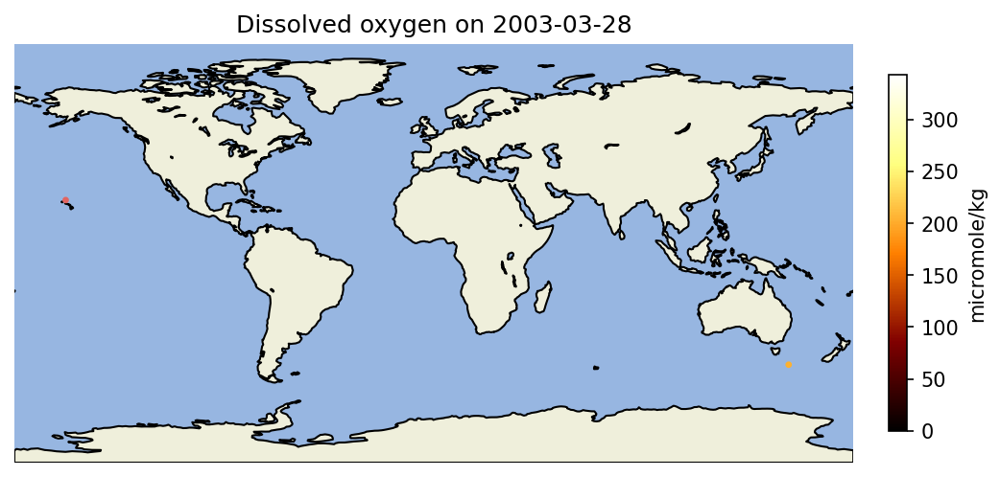

In [3]:
import cartopy
import matplotlib.animation
import matplotlib.pyplot as plt
from matplotlib import colormaps
from datetime import datetime, timedelta
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150
plt.ioff()

# Start and end of animation
start_t = df['JULD'].min()
end_t = df['JULD'].max()

# Setting number of frames for animation
nb_frames = 40

# Setting values of each time to plot
datetime_values = pd.date_range(start=start_t, end=end_t, periods=nb_frames+1).values

# Setting up plot
proj = cartopy.crs.PlateCarree()
fig = plt.figure(figsize=(8, 6), )
ax = fig.add_subplot(projection=proj, frameon=False)

# Setting up colormap
cbar_min = df['DOXY_ADJUSTED'].quantile(q=0.01)
cbar_max = df['DOXY_ADJUSTED'].quantile(q=0.99)
sc = ax.scatter([], [], c=[], cmap='afmhot', vmin=cbar_min, vmax=cbar_max, transform=cartopy.crs.PlateCarree())
cbar = plt.colorbar(sc, ax=ax, fraction=0.02, pad=0.04)
cbar.set_label('micromole/kg')

# note that update() is passed the current frame number by FuncAnimation()
def update(frame):
    plt.cla()
    ax.add_feature(cartopy.feature.OCEAN)
    ax.add_feature(cartopy.feature.LAND, edgecolor='black')
    ax.add_feature(cartopy.feature.LAKES, edgecolor='black')
    t_i = datetime_values[frame]
    t_ip1 = datetime_values[frame+1]

    # Extracting data for the time window illustrated by current frame
    timestep_df = df[(df['JULD'] >= t_i) & (df['JULD'] <= t_ip1)]
    # For each float, display only the earliest measurement within the time window
    idx = timestep_df.groupby('PLATFORM_NUMBER')['JULD'].idxmin()
    timestep_df = timestep_df.loc[idx]

    ax.scatter(
        timestep_df['LONGITUDE'],
        timestep_df['LATITUDE'],
        c=timestep_df['DOXY_ADJUSTED'],
        s=5,
        cmap='plasma',
        vmin=cbar_min,
        vmax=cbar_max,
        transform=cartopy.crs.PlateCarree()
        )

    plt.xlim(-180,180)
    plt.ylim(-90,90)
    plt.title("Dissolved oxygen on " + np.datetime_as_string(t_ip1, unit='D'))

matplotlib.animation.FuncAnimation(fig, update, frames=nb_frames)